In [1]:
import pandas as pd


In [2]:
def get_skiprows(required_indices, file_path):
    # 读取文件的第一列（假设第一列是索引列），并获取所有行号
    with open(file_path, 'r') as f:
        all_indices = [int(line.split('\t')[0]) for line in f.readlines()]
    
    # 找出需要跳过的行号
    skiprows = [i for i, idx in enumerate(all_indices) if idx not in required_indices]
    return skiprows

In [3]:
# 打开TSV文件并逐行读取前10行
file_path = r"/data/shanggk/normalise/scRNA_seq_new.tsv"
num_lines_to_display = 10

with open(file_path, 'r', encoding='utf-8') as file:
    lines = [next(file) for _ in range(num_lines_to_display)]

# 打印前10行
for line in lines:
    print(line.strip())  # 使用strip()去除行尾的换行符

Gene_sample	TGAAGCGTAGGTGAGGTCT-3-5607	GCTTTGGCACGAAACG-84	AGGGAACGAACCACGCT-3	ATGCTCCGTCTGAGTGC-92	TGCAAGGGAGCGCGAT-4-5779	ATTGGATCGAGCGAAGT-20-5607	GAGAATACGCAAGTAATC-18	GAATTCCTTGTGTGGCTA-10-5898	ACAACGTGGTAGTCTAG-38	AGGTTAGTGAACTTAGC-5-5779	AAATGACCCCATCGCAG-6-5898	GGAAACAGCCTGTTAT-9-5779	CCCAAGCATGCCATCG-61	TGAAAATGTCGACCCACGA-2	GAGAGAGTATACGCAGAG-18	TGACAGACCATATCCCACG-46	TGATCCAGTCCTGACCCTC-65	GAGGTCCCTTCCCGAATG-43	AAATGACCCACCACGCT-65	GATGTGCTCACAATTAGT-10	AGTGGATGGGGCCTAAG-55	TGAAACACACGCGTAGAAG-14-5607	TGAGCCACATCGATTTACC-8-5898	GTTCAACTCGGCTTAC-3-5898	TGACGTAGAAGGATGTGAG-0-5898	TGACTAGTAACTGCGTATC-7	AAAACCTCCTCTAGCAG-30	TGCCTCACACATCTAT-35	GATTGAGGGTTCGAAGCT-21-5779	CTTACGGGCTTCAGGT-5	AGCAAAGCCGGGAAATC-10-5898	GACCACATTAAGAAGTTA-23-5607	GAATCAAGTGATTCGACG-19-5779	GGAGAAGCGGGAGGTA-10	TGATTCGCTGGATTGGGCC-18-5607	GAGAAAGACCTGACCCTC-7	ACGTGCTAGTTCGTTCC-6-5779	ATTAGGACCATTTCCGG-10-5607	GAGATCTCGGGAGTTCAC-0-5607	TGCGACAGGCCACATC-50	TGAAACACACGATATCTTC-22-5779	ACGTATACGGTTAGTG-61	G

In [14]:
# 读取所有tsv
df = pd.read_csv(file_path, sep='\t', encoding='utf-8')

KeyboardInterrupt: 

In [4]:
df_meta = pd.read_csv(r"/data/shanggk/normalise/Meta_data_new.tsv", sep='\t', encoding='utf-8')
df_meta

,Cell_ID,Cell_type,Sample_ID
0,TGAAGCGTAGGTGAGGTCT-3-5607,ABS,HTA11_7862_2000002021
1,GCTTTGGCACGAAACG-84,ABS,HTA11_5216_2000001011
2,AGGGAACGAACCACGCT-3,ABS,HTA11_2487_2000001011
3,ATGCTCCGTCTGAGTGC-92,ABS,HTA11_411_2000002021
4,TGCAAGGGAGCGCGAT-4-5779,STM,HTA11_8622_2000001021
...,...,...,...
69499,ATTTGGGAGTTATCTGT-4-5607,TAC,HTA11_10167_2000002021
69500,TGAAAACTGGTACGCTCAG-18-5607,ABS,HTA11_7862_2000001011
69501,GATTCCGAGTATTCGACG-5-5607,SSC,HTA11_8099_2000001011
69502,GAACTAGGATATCAGCGC-11-5607,ABS,HTA11_7956_2000002011


In [5]:
# 重新设置df_meta所有列名为Cell	Cell_type	Specimen_ID
df_meta.columns = ['Cell', 'Cell_type', 'Specimen_ID']


In [6]:
# 将第一列设为索引
df_meta.set_index('Cell', inplace=True)
df_meta

,Cell_type,Specimen_ID
Cell,,
TGAAGCGTAGGTGAGGTCT-3-5607,ABS,HTA11_7862_2000002021
GCTTTGGCACGAAACG-84,ABS,HTA11_5216_2000001011
AGGGAACGAACCACGCT-3,ABS,HTA11_2487_2000001011
ATGCTCCGTCTGAGTGC-92,ABS,HTA11_411_2000002021
TGCAAGGGAGCGCGAT-4-5779,STM,HTA11_8622_2000001021
...,...,...
ATTTGGGAGTTATCTGT-4-5607,TAC,HTA11_10167_2000002021
TGAAAACTGGTACGCTCAG-18-5607,ABS,HTA11_7862_2000001011
GATTCCGAGTATTCGACG-5-5607,SSC,HTA11_8099_2000001011


In [8]:
# 将df第一列设置为的索引
df.set_index('Gene_sample', inplace=True)

NameError: name 'df' is not defined

In [22]:
gene_expression = df.T
gene_expression

Gene_sample,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283696,ENSG00000283697,ENSG00000288784,ENSG00000288825,ENSG00000288859,ENSG00000288867,ENSG00000289549,ENSG00000289604,ENSG00000290292,ENSG00000291237
TGCAAGGGAGCGCGAT-4-5779,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,1.672843,0.045558,0.045558,...,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,6.554699
GAGAATACGCAAGTAATC-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.934982
AGGTTAGTGAACTTAGC-5-5779,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,...,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,2.532149
TGAAAATGTCGACCCACGA-2,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.647571,0.018667,0.018667,...,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.647571,0.647571
GAGAGAGTATACGCAGAG-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGAGCCACATCGAGGCTGA-4-5779,0.045558,0.045558,1.672843,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,...,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,1.672843,1.672843
AGATGTATTCGCTAATA-7-5779,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,...,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960
CTTCAGGTGGCCCTTA-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.934982,0.044217,0.044217,0.044217,0.044217,0.934982
GGAAACAGCCTGACAC-16-5607,0.058559,0.058559,1.060151,1.060151,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,...,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,2.061742


In [30]:
# 将gene_expression的索引设置为Gene_sample
gene_expression.index

Index(['TGCAAGGGAGCGCGAT-4-5779', 'GAGAATACGCAAGTAATC-18',
       'AGGTTAGTGAACTTAGC-5-5779', 'TGAAAATGTCGACCCACGA-2',
       'GAGAGAGTATACGCAGAG-18', 'TGACAGACCATATCCCACG-46',
       'AAAACCTCCTCTAGCAG-30', 'TGCCTCACACATCTAT-35', 'CTTACGGGCTTCAGGT-5',
       'TGATTCGCTGGATTGGGCC-18-5607',
       ...
       'AGGCAACGTGACCCTC-10-5779', 'ACTAGATTGATCAGCGC-17-5779',
       'GACTAGACCCCAGATTAC-13-5779', 'AAATCAGAGTCAATAC-91',
       'AAATCGGGTACCCATAT-2', 'TGAGCCACATCGAGGCTGA-4-5779',
       'AGATGTATTCGCTAATA-7-5779', 'CTTCAGGTGGCCCTTA-18',
       'GGAAACAGCCTGACAC-16-5607', 'GCTTACCTTGATGCCC-3-5779'],
      dtype='object', length=11067)

In [8]:
sc_meta = df_meta

In [7]:
# 获取所有CellType
cell_type = df_meta['Cell_type'].unique()
cell_type

array(['ABS', 'STM', 'TAC', 'SSC', 'GOB', 'EE', 'B', 'ASC', 'CT', 'MYE',
       'MAS', 'TUF', 'FIB', 'T', 'PLA', 'END'], dtype=object)

In [35]:
gene_expression

Gene_sample,ENSG00000000003,ENSG00000000005,ENSG00000000419,ENSG00000000457,ENSG00000000460,ENSG00000000938,ENSG00000000971,ENSG00000001036,ENSG00000001084,ENSG00000001167,...,ENSG00000283696,ENSG00000283697,ENSG00000288784,ENSG00000288825,ENSG00000288859,ENSG00000288867,ENSG00000289549,ENSG00000289604,ENSG00000290292,ENSG00000291237
TGCAAGGGAGCGCGAT-4-5779,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,1.672843,0.045558,0.045558,...,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,6.554699
GAGAATACGCAAGTAATC-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.934982
AGGTTAGTGAACTTAGC-5-5779,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,...,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,0.049991,2.532149
TGAAAATGTCGACCCACGA-2,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.647571,0.018667,0.018667,...,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.018667,0.647571,0.647571
GAGAGAGTATACGCAGAG-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGAGCCACATCGAGGCTGA-4-5779,0.045558,0.045558,1.672843,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,...,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,0.045558,1.672843,1.672843
AGATGTATTCGCTAATA-7-5779,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,...,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960,0.060960
CTTCAGGTGGCCCTTA-18,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,0.044217,...,0.044217,0.044217,0.044217,0.044217,0.934982,0.044217,0.044217,0.044217,0.044217,0.934982
GGAAACAGCCTGACAC-16-5607,0.058559,0.058559,1.060151,1.060151,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,...,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,0.058559,2.061742


In [11]:
sc_meta.head(10)

,Cell_type,Specimen_ID
Cell,,
TGAAGCGTAGGTGAGGTCT-3-5607,ABS,HTA11_7862_2000002021
GCTTTGGCACGAAACG-84,ABS,HTA11_5216_2000001011
AGGGAACGAACCACGCT-3,ABS,HTA11_2487_2000001011
ATGCTCCGTCTGAGTGC-92,ABS,HTA11_411_2000002021
TGCAAGGGAGCGCGAT-4-5779,STM,HTA11_8622_2000001021
ATTGGATCGAGCGAAGT-20-5607,TAC,HTA11_8920_2000002011
GAGAATACGCAAGTAATC-18,ABS,HTA11_3410_2000002021
GAATTCCTTGTGTGGCTA-10-5898,ABS,HTA11_6801_2000002021
ACAACGTGGTAGTCTAG-38,ABS,HTA11_3077_2000002011


['CTTACGGGCTTCAGGT-5', 'ACTGCGTTGTAGTCTAG-5', 'GGAGAAGCATATACCT-5', 'AAGACACCACTCGCGTA-5', 'GCTTTGGCTGATGCCC-5', 'GATAAGACGGCATTTGTT-51', 'GCTTTGGCGTCCGTAC-5', 'TACTTGTGTCTGTGGT-5', 'AAATGACCCTGGCTACC-5', 'GAGACGATGGACATCTAT-5', 'AACTTAGCACCCACGA-5', 'GATGTGAGACCCACGA-5', 'GATGACGGACTTCCGCTC-5', 'AGGTGACACTGACCCTC-5', 'AGCCAAGATAAGCGTAC-5', 'GAACTGCCGTGGCTACTA-5', 'AAAAGTCGGTCGTCATG-51', 'CCCAAGCACGGGTAGT-5', 'AGAACGATTGCTTTGGC-5', 'TGACTTCGCACTCATGAGG-5', 'GATGTTCCAGAGAAGTCC-5', 'GACCCTTCAGGGCCCTTA-51', 'GACACGGACTACGCTCAG-5', 'AAGCGAAGTGGTCTGAC-5', 'AGTCAAAGACCAGCAGT-51', 'AACTCACCGCCCATAGC-5', 'GTACCTTGAATGTTTG-5', 'GATAAGACGGATGGGCAC-5', 'AGCAACCTGTGCGTATC-5', 'TGACGTAGAAGCGTATTTC-5', 'AACGAAACGGCAAAGCC-5', 'AATTCCCAACCCACGA-5', 'TTATAGCCGTCAAAGA-5', 'TGACTTCGCACGCGTTGCT-79', 'GGGTTGGTACCTTGCC-5', 'TGATTCACATACCACATTA-5', 'AAAATCGTTTGTGCTCA-51', 'ACTACTTGTCGTGCTAG-5', 'GAATGGGCACAAAGTCGG-5', 'TTAAGCGTGGCTACTA-5', 'AAATGAATGTAACCCGT-5', 'GAGAAAGACCGGGAACCT-5', 'GATCGGTTTATGTCTTTC-5'

NameError: name 'gene_expression' is not defined

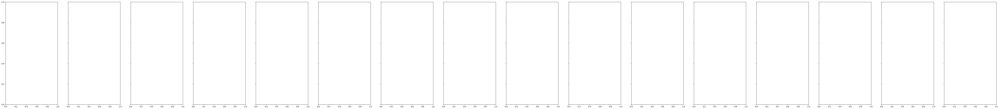

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 假设 cell_type 是一个包含细胞类型的列表
# 假设 sc_meta 是一个包含样本元数据的 DataFrame
# 假设 gene_expression 是一个包含基因表达数据的 DataFrame

# 设置画布大小
fig, axes = plt.subplots(nrows=1, ncols=len(cell_type), figsize=( 6 * len(cell_type),10), sharey=True)
# target_id = sc_meta[sc_meta['Cell_type'] == 'ABS']["Specimen_ID"].value_counts().idxmax()
# 遍历每个细胞类型
# 选出样本ID为HTA11_6818_2000001021的细胞
id1='HTA11_2951_2000001011'
id2='HTA11_546_2000002011'
for i, cell in enumerate(cell_type):

    # 找到对应的索引
    index = sc_meta[(sc_meta['Cell_type'] == cell) & (sc_meta['Specimen_ID'] == id1)].index.tolist()
    # 获取该细胞类型中数量最多的样本
    target_id = sc_meta[sc_meta['Cell_type'] == cell]["Specimen_ID"].value_counts().idxmax()
    # 找到对应的索引
    # 找到对应的索引，满足细胞类型等于cell且样本ID等于target_id
    index2 = sc_meta[(sc_meta['Cell_type'] == cell) & (sc_meta['Specimen_ID'] == id2)].index.tolist()
    # 取出其中来自同一个样本的细胞
    # 取出对应的行
    print(index)
    print(index2)
    # 
    skiprows = get_skiprows(index+index2, r"/data/shanggk/normalise/scRNA_seq_new.tsv")

    # 使用pandas读取文件，跳过不需要的行
    df = pd.read_csv('your_file.tsv', sep='\t', skiprows=skiprows)
    print("df",df)
    df.set_index('Gene_sample', inplace=True)
    gene_expression = df.T
    data_tot = gene_expression.loc[index, :]
    data_one = gene_expression.loc[index2, :]
    # 计算每行的和
    data_tot["SUM"] = data_tot.sum(axis=1)
    data_one["SUM"] = data_one.sum(axis=1)
    print(data_tot)
    # 创建一个新的DataFrame来存储两个数据集的 "SUM" 列
    data = pd.DataFrame({
        'SUM': pd.concat([data_tot["SUM"], data_one["SUM"]]),
        'Dataset': [id1] * len(data_tot) + [id2] * len(data_one)
    })
    print(data)
    # 在子图上绘制箱线图
    # 如果该细胞类型没有就跳过
    if len(index) == 0 or len(index2) == 0:
        continue
    sns.boxplot(x='Dataset', y='SUM', data=data, palette='Set2', ax=axes[i])
    axes[i].set_title(f'Boxplot Comparison of {cell}')
    axes[i].set_ylabel('SUM Values')
    axes[i].set_xticklabels([id1, id2])

# 调整子图间距
plt.tight_layout()

#plt.savefig(r'report\boxplot\boxplot_comparison_SAMPLEvsTOT'+'of '+id1+id2+'.png')

STM
Skipping STM due to insufficient data.
ABS
8973.739394219465
9637.66885427774
GOB
7064.906382978048
6868.038500449155
CT
8217.6641283269
9742.944759275038
TAC
10692.345681464183
10097.231075386675
ASC
8630.21735547281
7791.848789546609
FIB
Skipping FIB due to insufficient data.
SSC
Skipping SSC due to insufficient data.
T
3393.822982473144
3522.0347308844193
PLA
6616.117734620822
8472.93716889824
MYE
4890.405580938733
4886.862715596222
MAS
5139.619886819494
5348.242394323655
EE
5738.724476453374
7249.733563016644
B
Skipping B due to insufficient data.
TUF
7717.172484231928
3542.9735338198616
END
3679.81820767027
3105.8852711303866


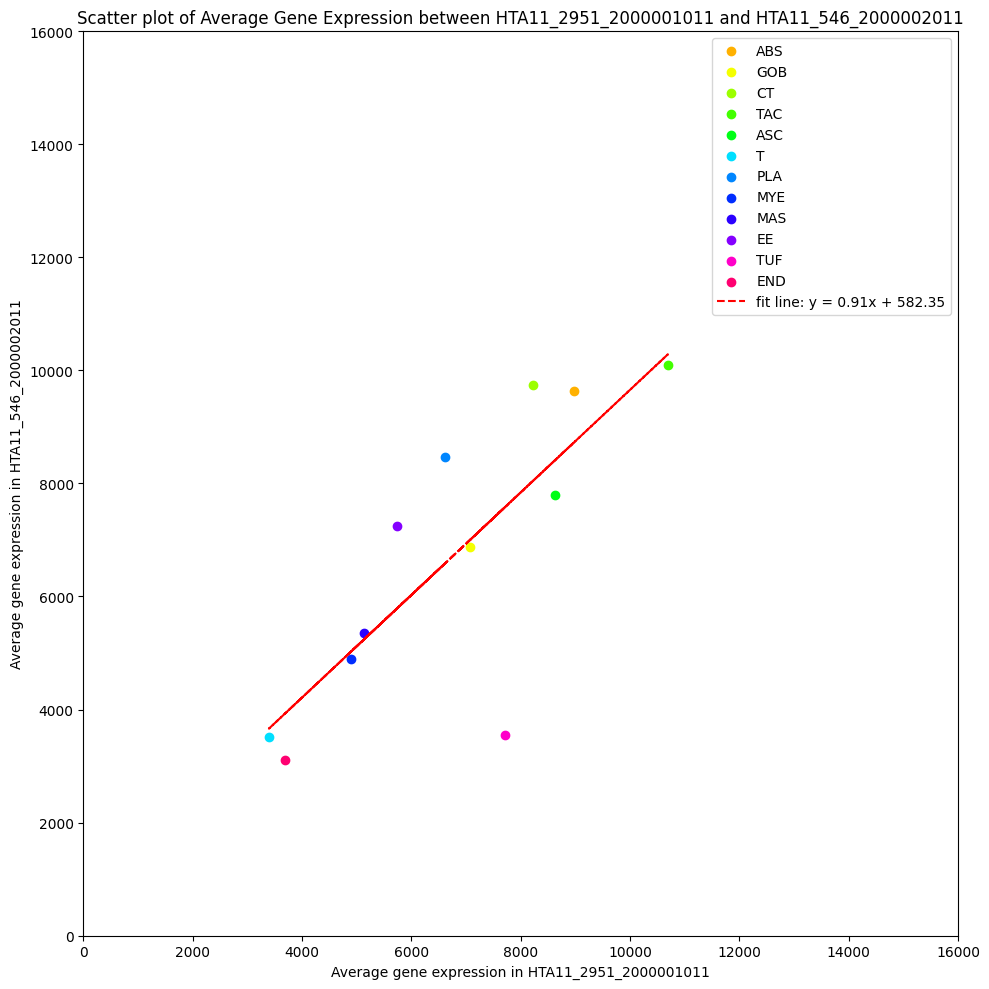

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 假设 cell_type 是一个包含细胞类型的列表
# 假设 sc_meta 是一个包含样本元数据的 DataFrame
# 假设 gene_expression 是一个包含基因表达数据的 DataFrame

# 设置画布大小
plt.figure(figsize=(10, 10))
id1='HTA11_2951_2000001011'
id2='HTA11_546_2000002011'
# 定义颜色列表，确保每种细胞类型有不同的颜色
palette = sns.color_palette("hsv", len(cell_type))  # 使用HSV颜色映射，可以根据需要调整
x=[]
y=[]
# 遍历每个细胞类型
for i, cell in enumerate(cell_type):
    print(cell)
    # 找到满足条件的索引
    index1 = sc_meta[(sc_meta['Cell_type'] == cell) & (sc_meta['Specimen_ID'] == id1)].index.tolist()
    index2 = sc_meta[(sc_meta['Cell_type'] == cell) & (sc_meta['Specimen_ID'] == id2)].index.tolist()
    
    if len(index1) == 0 or len(index2) == 0:
        print(f"Skipping {cell} due to insufficient data.")
        continue

    # 取出对应的基因表达数据
    data_tot = gene_expression.loc[index1, :]
    data_one = gene_expression.loc[index2, :]

    # 计算每种细胞的平均基因表达值
    data_tot["SUM"] = data_tot.sum(axis=1)
    data_one["SUM"] = data_one.sum(axis=1)

    cell_mean1 = data_tot['SUM'].mean(axis=0)
    cell_mean2 = data_one['SUM'].mean(axis=0)
    print(cell_mean1)
    print(cell_mean2)
    # 绘制散点图，为每种细胞类型分配不同的颜色
    plt.scatter(cell_mean1, cell_mean2, color=palette[i], label=cell)
    x.append(cell_mean1)
    y.append(cell_mean2)

# 添加标题和标签
plt.title(f'Scatter plot of Average Gene Expression between {id1} and {id2}')
plt.xlabel(f'Average gene expression in {id1}')
plt.ylabel(f'Average gene expression in {id2}')
# 使用NumPy的polyfit函数进行线性拟合
import numpy as np

x = np.array(x)  # 示例X数据
y = np.array(y)  # 示例Y数据
coefficients = np.polyfit(x, y, 1)  # 1表示线性拟合
slope, intercept = coefficients  # 斜率和截距

# 计算拟合直线的Y值
y_fit = slope * x + intercept

# 添加图例
plt.legend(title="Cell Types", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.plot(x, y_fit, color='red', linestyle='--', label=f'fit line: y = {slope:.2f}x + {intercept:.2f}')  # 虚线
plt.xlim(0, 16000)
plt.ylim(0, 16000)
# 显示图表
plt.legend()
plt.tight_layout()
plt.show()